
The processing steps included
1. Scene stiching and Coregistration (alignment of scenes)
2. Removal of topograhic contribution with DEM obtained from PyGMT
3. Geocoding transform (conversion from radar to geographic coordinates)
4. Intergerogram Processing
    - Gaussian filtering & phase differencing with topography correction
    - Gaussian filtering & correlation with 0.25 decimation (~15m resolution)
    - Goldstein filter & complex phase difference conversion to create interferogram
5. Landmasking to remove water noise
6. Unwrapping to obatain surface displacement
7. Detrending to remove ionospheric component
9. Conversion to LOS displacement
10. Seperation of LOS into E-W and Vertical components
<br>

The scenes were downloaded from `2023-01-29` and `2023-02-10`


```python
# Path 21 Frames 465 - 471
SCENES = ['S1A_IW_SLC__1SDV_20230129T033427_20230129T033455_046993_05A2FE_6FF2',
          'S1A_IW_SLC__1SDV_20230129T033452_20230129T033519_046993_05A2FE_BE0B',
          'S1A_IW_SLC__1SDV_20230210T033426_20230210T033454_047168_05A8CD_FAA6',
          'S1A_IW_SLC__1SDV_20230210T033451_20230210T033518_047168_05A8CD_E5B0']
POLARIZATION = 'VV'
ORBIT        = 'D'
SUBSWATH     = 123
```
https://usgs.maps.arcgis.com/apps/webappviewer/index.html?id=5229bb842bd64b688d769abbefe43b46

In [1]:
from datetime import datetime
import fiona
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None # suppress SettingWithCopyWarning error
import pygmt
from pygmt.datasets import load_earth_relief
from shapely import wkt
import shapely
import xarray as xr
fiona.drvsupport.supported_drivers['KML'] = 'rw'

## Figure 1

In [2]:
# load the 03s DEM grid with "gridline" registration from `@earth_relief_03s`
region = [35.1,39.05,35.5,39]
dem_grid = load_earth_relief("15s", region=region, registration="pixel")

# Load the shapefiles of active Turkey faults from USGS
tr_faults = gpd.read_file('InSAR_Data/Turkey_EQ_Fault/simple_fault_2023-03-15/simple_fault_2023-3-15.shp')
tr_faults = tr_faults.dropna(subset='geometry')

# Load the shapefiles of active global faults and filter them by distance from GEM GAF-DB
gl_faults = gpd.read_file('InSAR_Data/Global_Active_Faults/gem_active_faults_harmonized.shp')
gl_faults = gl_faults[gl_faults.geometry.to_crs('EPSG:4087').length>1.3e5].reset_index(drop=True)


# Load the earthquake mainshock locations, define their focal mechanisms, and convert to a dataframe
eql = pd.DataFrame({'lon':[37.014, 37.196],'lat':[37.226, 38.011],'dep':[10,7.4],
                    'foc_mec':[[37.014,37.226,10,318,89,-179,7.8,37.5,37],
                               [37.196,38.011,7.4,277,78,4,7.5,37.35,38.4]]})
eql = gpd.GeoDataFrame(eql, geometry=gpd.points_from_xy(eql.lon, eql.lat), crs="EPSG:4326")
# Create a text file for the fms because of the fig.meca bug
foc_mec = np.array(eql.foc_mec.to_list())
foc_mec = pd.DataFrame(foc_mec)
foc_mec.to_csv('fms.txt', sep='\t', index=False, header=None)


# Load the earthquake relocated catalog from Melgar (2023)
afs = pd.read_csv('InSAR_Data/Aftershocks_Melgar_2023.csv')
afs = afs.rename(columns={'min': 'minu'}) # Rename the minute column
afs = afs[afs.sec<60] # Remove rows where the seconds value equals 60
afs['date'] = afs.apply(lambda x: datetime.strptime(f"{x.year:.0f}-{x.month:.0f}-{x.day:.0f} \
{x.hour:.0f}:{x.minu:.0f}:{x.sec}","%Y-%m-%d %H:%M:%S.%f"), axis=1) # Create a date column

### Create the Basemap

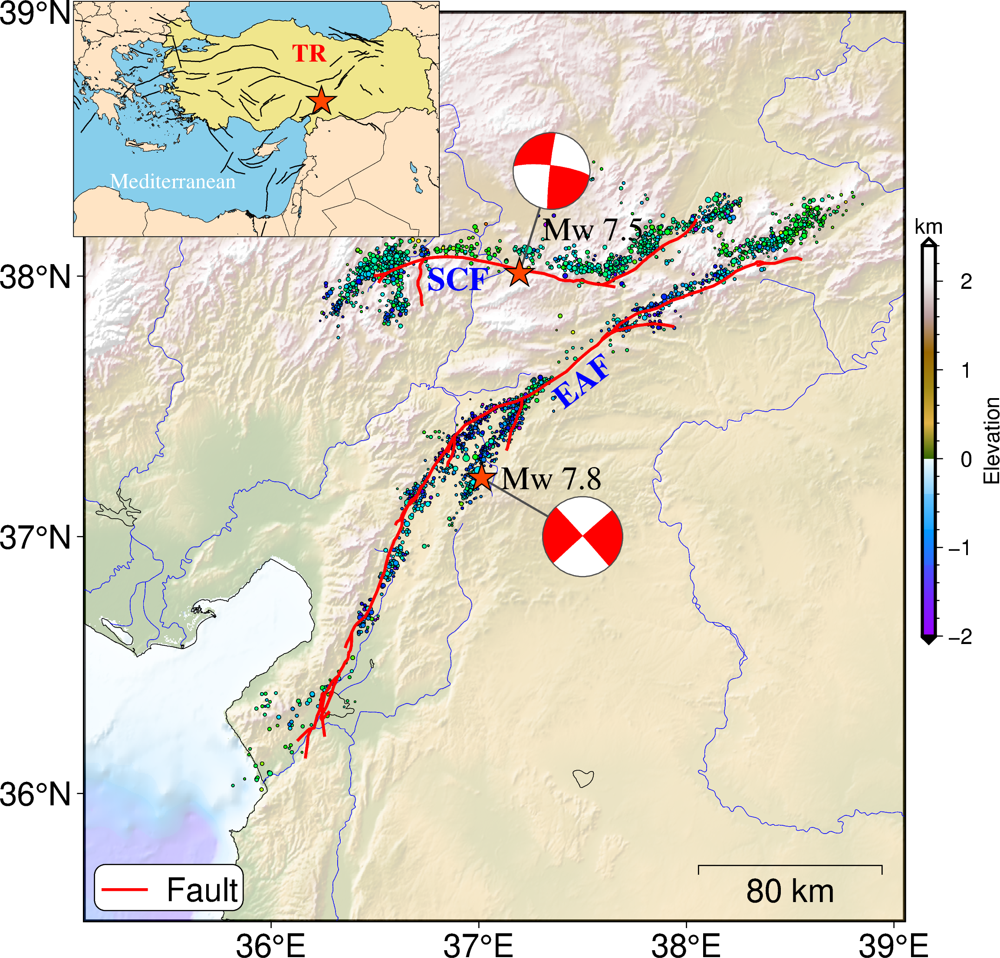

In [ ]:
# -------------------------------------- Create the pygmt figure --------------------------------------
fig = pygmt.Figure()

pygmt.config(MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="18p",FONT_LABEL='16p',FONT_TAG="16p",)

fig.basemap(region=region, projection='M16c',frame=['WSrt',"a"])

# ------------------------ Plot high res DEM, make a color limit, plot the basemap ------------------------
pygmt.makecpt(cmap='globe',series='-2000/2500/400', continuous=True)
fig.grdimage(grid=dem_grid, shading=True, transparency=70, frame=None)
fig.coast(rivers="r/0.2p,blue",shorelines=True,map_scale='g38.5/35.7+w80k+al+ukm',borders="2/0.5p,black")

# ------------------------------------ Plot the shapefiles ------------------------------------
fig.plot(region=region, x=afs.lon, y=afs.lat, style="cc", pen='black', cmap='rainbow', 
         fill=afs['dep (km)'] / afs['dep (km)'].max(), size=afs.mag*0.02)
fig.plot(region=region, data=tr_faults, pen="1.5p,red", label='Fault') # Turkey Faults
fig.meca(spec='fms.txt',scale="1c",convention='aki',offset='1p,gray30',
         compressionfill="red",extensionfill="white",pen="0.5p,gray30,solid")
fig.plot(region=region, x=eql.lon, y=eql.lat, style="a0.6c", pen="0.5p,black", fill='orangered')
fig.text(text=['Mw 7.8','Mw 7.5'],font="18p,Times-Roman,black",x=[37.35, 37.55],y=[37.226, 38.18])
fig.text(text='EAF',font="18p,Times-Bold,blue",x=37.5,y=37.6,angle=38)
fig.text(text='SCF',font="18p,Times-Bold,blue",x=36.9,y=37.99,angle=0)

# ------------------------------------ Plot the Legend ------------------------------------
fig.legend(position="JBL+jBL+o0.2c+w2.9c/0.9c", box='+gwhite+p0.5p+r')

# ------------------------------------ Inset Map ------------------------------------
with fig.inset(position="jTL+w2.8i/1.8i+o-0.2c", box="+gwhite+p1p"):
    fig.coast(region=[20,45,30,45],projection="M2.8i",borders="1/0.1,black",shorelines="0.1p,black",
              land='bisque1',water="skyblue",dcw=["TR+gkhaki+p0.2p"],resolution='h')
    fig.plot(region=[20,45,30,45], data=gl_faults, pen="0.5p,black")
    fig.plot(x=[40], y=[39], style="a0.6c", pen="0.5p,black", fill='orangered')
    fig.text(text='Mediterranean',font="12p,Times-Roman,white",x=28,y=33.8)
    fig.text(text='TR',font="14p,Times-Bold,red",x=39,y=42)

# ------------------------------------ Color Bar------------------------------------
pygmt.config(FONT_ANNOT_PRIMARY="12p",FONT_LABEL='12p')
fig.colorbar(frame=['x+l"Elevation"','y+lkm'],scale=0.001, position="jMR+o-0.6/0.5c+w3i/0.1i+e+m+v",)

fig.savefig('Figures/01_Basemap_Study_Area.png')
fig.show()

## Figure 2

In [4]:
# ------------------- Import the Sentinel-1 Frames that were used for analysis -------------------
# Individual Sentinel-1 frames
single_frames = pd.read_csv('InSAR_Data/Individual_Sentinel-1_frames_Turkiye_Earthquake.csv')
single_frames['geometry'] = single_frames['geometry'].apply(wkt.loads)
single_frames = gpd.GeoDataFrame(single_frames, crs='epsg:4326')

# Merged Sentinel-1 frames
stitch_frames = pd.read_csv('InSAR_Data/Stiched_Sentinel-1_frames_Turkiye_Earthquake.csv')
stitch_frames['geometry'] = stitch_frames['geometry'].apply(wkt.loads)
stitch_frames = gpd.GeoDataFrame(stitch_frames, crs='epsg:4326')

### Plot the Sentinel-1 Frames

In [5]:
fig = pygmt.Figure()
# Define figure configuration
pygmt.config(MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="18p",)
sent_1_frms = [single_frames,stitch_frames]
frame_titles = ['Individual Frames','Stitched Frames']
with fig.subplot(nrows=1,ncols=2,figsize=("25.3c", "12c"),sharex="b",sharey="l",margins='0.5c'):
    for i in range(1):            # row number starting from 0
        for j in range(2):        # column number starting from 0
            index = i * 2 + j     # index number starting from 0
            with fig.set_panel(panel=index):  # sets the current panel
                sbp_proj = "X11.9c/12c"
                fig.basemap(region=region, projection=sbp_proj, frame=True)
                fig.coast(shorelines="0.5p",map_scale='g38.5/35.75+w50k+al+ukm',borders="2/0.5p,black")
                fig.grdimage(region=region,grid=dem_grid, shading=True, transparency=50, cmap='gray')
                fig.plot(sent_1_frms[index],region=region,pen="0.5p,black",fill='lightcoral', transparency=60)
                fig.plot(data=tr_faults, region=region, pen="1.0p,black")
                fig.plot(x=eql.lon, y=eql.lat, style="a0.6c", pen="0.5p,black", fill='white')
                fig.text(position='TC', text=frame_titles[index],offset='-0.0c/1.0c',
                         font="20p,Times-Roman,black",no_clip=True)
fig.savefig('Figures/02_Stiching_and_Coregistration.png')
fig.show()

## Figure 3

In [6]:
# ------------------------ Load the wrapped interferogram and coherence ------------------------
intf = xr.open_dataset("InSAR_Data/interferogram_without_mask_geographic_coords.nc")
cohr = xr.open_dataset("InSAR_Data/coherence_without_mask_geographic_coords.nc")
lnd_msk = xr.open_dataarray("InSAR_Data/landmask_geographic_coords.nc")

# --------------------- Mask out data below a coherence/landmask threshold ---------------------
cohr = xr.where((cohr['correlation']>0.08) & (cohr['correlation']<0.3), 0.3, cohr['correlation'])
mask = ((cohr>=0.3) & (lnd_msk>0))
intf = intf['phase'].where(mask)
cohr = cohr.where(mask)

### Plot the wrapped inteferogram and coherence

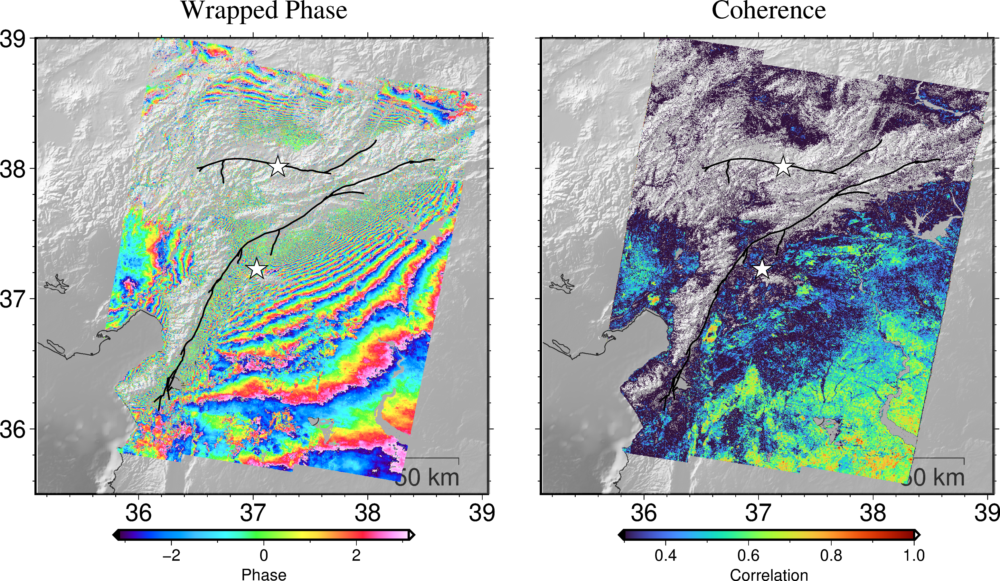

In [7]:
fig = pygmt.Figure()
# Define figure configuration
pygmt.config(MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="18p",)
sent_1_frms = [intf,cohr]
cmaps = ['gmt/wysiwyg','google/turbo']
frame_titles = ['Wrapped Phase','Coherence']
cmls = ['Phase','Correlation']
with fig.subplot(nrows=1,ncols=2,figsize=("25.3c", "12c"),sharex="b",sharey="l",margins='0.5c'):
    for i in range(1):            # row number starting from 0
        for j in range(2):        # column number starting from 0
            idx = i * 2 + j       # index number starting from 0
            with fig.set_panel(panel=idx):  # sets the current panel
                sbp_proj = "X11.9c/12c"
                fig.basemap(region=region, projection=sbp_proj, frame=True)
                fig.coast(shorelines="0.5p",map_scale='g38.5/35.75+w50k+al+ukm',borders="2/0.5p,black")
                fig.grdimage(region=region,grid=dem_grid, shading=True, transparency=50, cmap='gray')
                fig.grdimage(sent_1_frms[idx],region=region, cmap=cmaps[idx], nan_transparent=True)
                fig.plot(data=tr_faults, region=region, pen="1.0p,black")
                fig.plot(x=eql.lon, y=eql.lat, style="a0.6c", pen="0.5p,black", fill='white')
                fig.text(position='TC', text=frame_titles[idx],offset='-0.0c/1.0c',
                         font="20p,Times-Roman,black",no_clip=True)
                pygmt.config(FONT_ANNOT_PRIMARY="12p",FONT_LABEL='12p')
                fig.colorbar(frame=[f'x+l"{cmls[idx]}"'], position="jBC+o-0/-1.2c+w3i/0.1i+e+m+h",)
fig.savefig('Figures/03_Interferogram_and_Coherence.png')
fig.show()

## Figure 4

In [8]:
# -------------------- Load the unwrapped interferogram and detrended displacement --------------------
# Detrending helped remove the ionospheric contribution
phse = xr.open_dataset("InSAR_Data/unwrapped_phase_geographic_coords.nc")
detr = xr.open_dataset("InSAR_Data/detrend_unwrapped_phase_geographic_coords.nc")

# ------------------------- Mask out data below a coherence/landmask threshold -------------------------
phse = phse['phase'].where(mask)
detr = detr['phase'].where(mask)

### Plot the unwrapped interferogram before and after removing the ionospheric contribution

In [9]:
fig = pygmt.Figure()
# Define figure configuration
pygmt.config(MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="18p",)
sent_1_frms = [phse,detr]
cmaps = ['gmt/rainbow','gmt/rainbow']
frame_titles = ['Unwrapped Phase','Detrended Phase']
cmls = ['Phase','Phase']
with fig.subplot(nrows=1,ncols=2,figsize=("25.3c", "12c"),sharex="b",sharey="l",margins='0.5c'):
    for i in range(1):            # row number starting from 0
        for j in range(2):        # column number starting from 0
            idx = i * 2 + j       # index number starting from 0
            with fig.set_panel(panel=idx):  # sets the current panel
                sbp_proj = "X11.9c/12c"
                fig.basemap(region=region, projection=sbp_proj, frame=True)
                fig.coast(shorelines="0.5p",map_scale='g38.5/35.75+w50k+al+ukm',borders="2/0.5p,black")
                fig.grdimage(region=region,grid=dem_grid, shading=True, transparency=50, cmap='gray')
                fig.grdimage(sent_1_frms[idx],region=region, cmap=cmaps[idx], nan_transparent=True)
                fig.plot(data=tr_faults, region=region, pen="1.0p,black")
                fig.plot(x=eql.lon, y=eql.lat, style="a0.6c", pen="0.5p,black", fill='white')
                fig.text(position='TC', text=frame_titles[idx],offset='-0.0c/1.0c',
                         font="20p,Times-Roman,black",no_clip=True)
                pygmt.config(FONT_ANNOT_PRIMARY="12p",FONT_LABEL='12p')
                fig.colorbar(frame=[f'x+l"{cmls[idx]}"','y+lrad'], position="jBC+o-0/-1.2c+w3i/0.1i+e+m+h",)
fig.savefig('Figures/04_Unwrapped_and_Detrend_Interferogram.png')
fig.show()

## Figure 5

In [10]:
# ------------------------ Load the line of sight displacement ------------------------
losd = xr.open_dataset("InSAR_Data/los_displacement_geographic_coords.nc")

# --------------------- Mask out data below a coherence/landmask threshold ---------------------
# Convert from mm to m
losd = losd['los'].where(mask)*0.001
# losd = xr.where(losd < -0.28, -0.28, xr.where(losd > 0.28, 0.28, losd))

### Plot the Line of sight displacement

In [11]:
# -------------------------------------- Create the pygmt figure --------------------------------------
fig = pygmt.Figure()

pygmt.config(MAP_FRAME_TYPE="plain",FONT_ANNOT_PRIMARY="18p",FONT_LABEL='16p',FONT_TAG="16p",)

fig.basemap(region=region, projection='M16c',frame=['WSrt',"a"])

# ------------------------ Plot high res DEM, make a color limit, plot the basemap ------------------------
fig.grdimage(grid=dem_grid, shading=True, transparency=50, cmap='gray', frame=None)
fig.coast(rivers="r/0.2p,blue",shorelines=True,map_scale='g38.5/35.7+w80k+al+ukm',borders="2/0.5p,black")
fig.grdimage(losd,region=region, cmap='matlab/polar', nan_transparent=True)

# ------------------------------------ Plot the shapefiles ------------------------------------
fig.plot(region=region, x=afs.lon, y=afs.lat, style="cc", pen='black', cmap='rainbow', 
         fill=afs['dep (km)'] / afs['dep (km)'].max(), size=afs.mag*0.02)
fig.plot(region=region, data=tr_faults, pen="1.5p,yellow", label='Fault') # Turkey Faults
fig.meca(spec='fms.txt',scale="1c",convention='aki',offset='1p,gray30',
         compressionfill="red",extensionfill="white",pen="0.5p,gray30,solid")
fig.plot(region=region, x=eql.lon, y=eql.lat, style="a0.6c", pen="0.5p,black", fill='white')
fig.text(text=['Mw 7.8','Mw 7.5'],font="18p,Times-Roman,black",x=[37.35, 37.55],y=[37.226, 38.18])
fig.text(text='EAF',font="18p,Times-Bold,black",x=37.5,y=37.6,angle=38)
fig.text(text='SCF',font="18p,Times-Bold,black",x=36.9,y=37.99,angle=0)

# ------------------------------------ Plot the Legend ------------------------------------
fig.legend(position="JBL+jBL+o0.2c+w2.9c/0.9c", box='+gwhite+p0.5p+r')

# ------------------------------------ Color Bar------------------------------------
pygmt.config(FONT_ANNOT_PRIMARY="12p",FONT_LABEL='12p')
# fig.colorbar(frame=['x+l"Elevation"','y+lkm'],scale=0.001, position="jMR+o-0.6/0.5c+w3i/0.1i+e+m+v",)
fig.colorbar(frame=[f'x+l"Displacement"','y+lm'], position="jBC+o-0/-1.2c+w3i/0.1i+e+m+h",)

fig.savefig('Figures/05_Line_of_sight_displacement.png')
fig.show()

## Figure 6

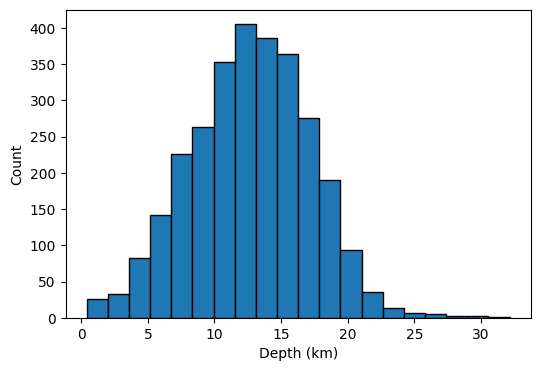

In [12]:
fig,ax = plt.subplots(figsize=(6,4))
ax.hist(afs['dep (km)'],bins=20,ec='k')
ax.set_xlabel('Depth (km)')
ax.set_ylabel('Count')
# ax.set_title('Depth Distribution of Relocated Events')
plt.savefig('Figures/06_Earthquakes_Dep_Dis.png', dpi=200, facecolor='white', 
            edgecolor='none', bbox_inches='tight')
plt.show()